## Setup: load data


In [35]:
import polars as pl
from pathlib import Path

dat_dict = {
    "iedb_human_I": {},
    "iedb_human_II": {},
    "iedb_mouse_I": {},
    "iedb_mouse_II": {},
    "vdjdb_human_I": {},
    "vdjdb_human_II": {},
    "vdjdb_mouse_I": {},
    "vdjdb_mouse_II": {},
}

iedb_human_I_datpath = Path("../data/iedb-vdjdb/iedb/human_I/iedb_human_I.csv")
iedb_human_I = pl.read_csv(iedb_human_I_datpath)
iedb_human_I_infdir = Path("../data/iedb-vdjdb/iedb/human_I/inference")

dat_dict["iedb_human_I"]["df"] = iedb_human_I
dat_dict["iedb_human_I"]["infdir"] = iedb_human_I_infdir
dat_dict["iedb_human_I"]["path"] = iedb_human_I_datpath


iedb_human_II_datpath = Path(
    "../data/iedb-vdjdb/iedb/human_II/iedb_human_II.csv"
)
iedb_human_II = pl.read_csv(iedb_human_II_datpath)
iedb_human_II_infdir = Path("../data/iedb-vdjdb/iedb/human_II/inference")

dat_dict["iedb_human_II"]["df"] = iedb_human_II
dat_dict["iedb_human_II"]["infdir"] = iedb_human_II_infdir
dat_dict["iedb_human_II"]["path"] = iedb_human_II_datpath

iedb_mouse_I_datpath = Path("../data/iedb-vdjdb/iedb/mouse_I/iedb_mouse_I.csv")
iedb_mouse_I = pl.read_csv(iedb_mouse_I_datpath)
iedb_mouse_I_infdir = Path("../data/iedb-vdjdb/iedb/mouse_I/inference")

dat_dict["iedb_mouse_I"]["df"] = iedb_mouse_I
dat_dict["iedb_mouse_I"]["infdir"] = iedb_mouse_I_infdir
dat_dict["iedb_mouse_I"]["path"] = iedb_mouse_I_datpath

iedb_mouse_II_datpath = Path(
    "../data/iedb-vdjdb/iedb/mouse_II/iedb_mouse_II.csv"
)
iedb_mouse_II = pl.read_csv(iedb_mouse_II_datpath)
iedb_mouse_II_infdir = Path("../data/iedb-vdjdb/iedb/mouse_II/inference")

dat_dict["iedb_mouse_II"]["df"] = iedb_mouse_II
dat_dict["iedb_mouse_II"]["infdir"] = iedb_mouse_II_infdir
dat_dict["iedb_mouse_II"]["path"] = iedb_mouse_II_datpath

vdjdb_human_I_datpath = Path(
    "../data/iedb-vdjdb/vdjdb/human_I/vdjdb_human_I.csv"
)
vdjdb_human_I = pl.read_csv(
    "../data/iedb-vdjdb/vdjdb/human_I/vdjdb_human_I.csv"
)
vdjdb_human_I_infdir = Path("../data/iedb-vdjdb/vdjdb/human_I/inference")

dat_dict["vdjdb_human_I"]["df"] = vdjdb_human_I
dat_dict["vdjdb_human_I"]["infdir"] = vdjdb_human_I_infdir
dat_dict["vdjdb_human_I"]["path"] = vdjdb_human_I_datpath


vdjdb_human_II_datpath = Path(
    "../data/iedb-vdjdb/vdjdb/human_II/vdjdb_human_II.csv"
)
vdjdb_human_II = pl.read_csv(vdjdb_human_II_datpath)
vdjdb_human_II_infdir = Path("../data/iedb-vdjdb/vdjdb/human_II/inference")

dat_dict["vdjdb_human_II"]["df"] = vdjdb_human_II
dat_dict["vdjdb_human_II"]["infdir"] = vdjdb_human_II_infdir
dat_dict["vdjdb_human_II"]["path"] = vdjdb_human_II_datpath


vdjdb_mouse_I_datpath = Path(
    "../data/iedb-vdjdb/vdjdb/mouse_I/vdjdb_mouse_I.csv"
)
vdjdb_mouse_I = pl.read_csv(
    "../data/iedb-vdjdb/vdjdb/mouse_I/vdjdb_mouse_I.csv"
)
vdjdb_mouse_I_infdir = Path("../data/iedb-vdjdb/vdjdb/mouse_I/inference")

dat_dict["vdjdb_mouse_I"]["df"] = vdjdb_mouse_I
dat_dict["vdjdb_mouse_I"]["infdir"] = vdjdb_mouse_I_infdir
dat_dict["vdjdb_mouse_I"]["path"] = vdjdb_mouse_I_datpath

vdjdb_mouse_II_datpath = Path(
    "../data/iedb-vdjdb/vdjdb/mouse_II/vdjdb_mouse_II.csv"
)
vdjdb_mouse_II = pl.read_csv(vdjdb_mouse_II_datpath)
vdjdb_mouse_II_infdir = Path("../data/iedb-vdjdb/vdjdb/mouse_II/inference")

dat_dict["vdjdb_mouse_II"]["df"] = vdjdb_mouse_II
dat_dict["vdjdb_mouse_II"]["infdir"] = vdjdb_mouse_II_infdir
dat_dict["vdjdb_mouse_II"]["path"] = vdjdb_mouse_II_datpath

## Setup: feature extraction


In [36]:
from mdaf3.AF3OutputParser import *
from mdaf3.FeatureExtraction import *
from tcr_format_parsers.common.TCRUtils import annotate_tcr
from tcr_format_parsers.common.TriadUtils import (
    FORMAT_COLS,
    FORMAT_TCR_COLS,
    FORMAT_ANTIGEN_COLS,
    FORMAT_MHC_COLS,
)


def extract_mean_tcr_pmhc_pae(row, af3_parent_dir, **kwargs):
    af3_output = AF3Output(af3_parent_dir / row["job_name"], **kwargs)
    u = af3_output.get_mda_universe(**kwargs)

    pmhc_residx = u.select_atoms("segid A or segid B or segid C").resindices
    tcr_residx = u.select_atoms("segid D or segid E").resindices

    pae = af3_output.get_pae_ndarr(**kwargs)

    mean_interface_pae = np.mean(pae[pmhc_residx][:, tcr_residx])

    new_row = row.copy()

    new_row["mean_tcr_pmhc_pae"] = mean_interface_pae

    return pl.DataFrame(new_row)


def extract_min_tcr_pmhc_pae(row, af3_parent_dir, **kwargs):
    af3_output = AF3Output(af3_parent_dir / row["job_name"], **kwargs)
    summ = af3_output.get_summary_metrics(**kwargs)

    pae_chain = np.array(summ["chain_pair_pae_min"])
    tcr_p = min(pae_chain[0][3], pae_chain[0][4])
    tcr_m = min(
        min(pae_chain[1][3], pae_chain[1][4]),
        min(pae_chain[2][3], pae_chain[2][4]),
    )
    min_pae_dict = {
        "min_tcr_p_pae": tcr_p,
        "min_tcr_m_pae": tcr_m,
    }
    new_row = row.copy()

    new_row.update(min_pae_dict)

    return pl.DataFrame(new_row)


def extract_scalar(row, af3_parent_dir, **kwargs):
    af3_output = AF3Output(af3_parent_dir / row["job_name"], **kwargs)

    summ = af3_output.get_summary_metrics(**kwargs)

    scalar_dict = {
        "ptm": summ["ptm"],
        "iptm": summ["iptm"],
        "fraction_disordered": summ["fraction_disordered"],
        "has_clash": summ["has_clash"],
        "ranking_score": summ["ranking_score"],
    }

    new_row = row.copy()

    new_row.update(scalar_dict)

    return pl.DataFrame(new_row)


def extract_5(
    job_name,
    tcr_1_seq,
    tcr_1_chain,
    tcr_1_species,
    tcr_2_seq,
    tcr_2_chain,
    tcr_2_species,
    mhc_class,
    af3_parent_dir,
    seed=None,
    sample_num=None,
    peptide_tcr_thresh=0.5,
    tcr_mhc_thresh=0.9,
    **kwargs,
):

    af3_output = AF3Output(af3_parent_dir / job_name, **kwargs)
    u_af3 = af3_output.get_mda_universe(seed=seed, sample_num=sample_num)
    contact_probs = af3_output.get_contact_prob_ndarr(
        seed=seed, sample_num=sample_num
    )

    # 1 MDA residue = 1 "token" in AF3 nomenclature
    tcr_1_resindices = u_af3.select_atoms("segid D").residues.resindices

    tcr_1_indices, imgt_num = annotate_tcr(
        tcr_1_seq,
        tcr_1_resindices,
        tcr_1_chain,
        tcr_1_species,
    )

    # https://pmc.ncbi.nlm.nih.gov/articles/PMC6803477/#:~:text=TCR%20and%20antibody%20structures%20were,CDR3%20(105%E2%80%93117).
    # IMGT 105-117 are CDR3
    tcr_1_cdr3_indices = tcr_1_indices[(imgt_num >= 105) & (imgt_num <= 117)]

    tcr_2_resindices = u_af3.select_atoms("segid E").residues.resindices

    tcr_2_indices, imgt_num = annotate_tcr(
        tcr_2_seq,
        tcr_2_resindices,
        tcr_2_chain,
        tcr_2_species,
    )

    tcr_2_cdr3_indices = tcr_2_indices[(imgt_num >= 105) & (imgt_num <= 117)]

    cdr3_sel = (
        u_af3.residues[tcr_1_cdr3_indices].atoms
        + u_af3.residues[tcr_2_cdr3_indices].atoms
    )

    tcr_cdr3_min_pLDDT = cdr3_sel.tempfactors.min()

    max_min = 0
    peptide_sel = u_af3.select_atoms("segid A").residues
    for i in range(len(peptide_sel) - 8):
        min_pLDDT = peptide_sel[i : i + 9].atoms.tempfactors.min()
        if min_pLDDT > max_min:
            max_min = min_pLDDT
    peptide_min_pLDDT = max_min

    raw_alpha_helix_ix = raw_helix_indices(u_af3.select_atoms("segid B"))
    raw_beta_helix_ix = raw_helix_indices(u_af3.select_atoms("segid C"))

    resindices = []

    if mhc_class == "I":
        alpha_resindices = join_helix_indices(raw_alpha_helix_ix)
        if len(alpha_resindices) != 2:
            raise ValueError(
                "Expected 2 helices for MHC-I alpha chain, "
                f"got {len(alpha_resindices)}"
            )

        resindices.extend(h for hl in alpha_resindices for h in hl)

    else:
        # MHC-II
        alpha_resindices = join_helix_indices(raw_alpha_helix_ix)
        if len(alpha_resindices) != 1:
            print(
                "Expected 1 helix for MHC-II alpha chain, "
                f"got {len(alpha_resindices)}"
            )
            alpha_resindices = [alpha_resindices[0]]
            # raise ValueError(
            #     "Expected 1 helix for MHC-II alpha chain, "
            #     f"got {len(alpha_resindices)}"
            # )
        beta_resindices = join_helix_indices(raw_beta_helix_ix)
        if len(beta_resindices) != 1:
            print(
                "Expected 1 helix for MHC-II beta chain, "
                f"got {len(beta_resindices)}"
            )
            beta_resindices = [beta_resindices[0]]
            # raise ValueError(
            #     "Expected 1 helix for MHC-II beta chain, "
            #     f"got {len(beta_resindices)}"
            # )
        resindices.extend(h for hl in alpha_resindices for h in hl)
        resindices.extend(h for hl in beta_resindices for h in hl)

    mhc_helicies_min_pLDDT = u_af3.residues[resindices].atoms.tempfactors.min()

    peptide_tcr_contacts = np.count_nonzero(
        contact_probs[u_af3.select_atoms("segid A").residues.resindices][
            :, u_af3.select_atoms("segid D or segid E").residues.resindices
        ]
        > peptide_tcr_thresh
    )

    tcr_mhc_contacts = np.count_nonzero(
        contact_probs[
            u_af3.select_atoms("segid D or segid E").residues.resindices
        ][:, u_af3.select_atoms("segid B or segid C").residues.resindices]
        > tcr_mhc_thresh
    )

    return {
        "peptide_min_pLDDT": float(peptide_min_pLDDT),
        "tcr_cdr3_min_pLDDT": float(tcr_cdr3_min_pLDDT),
        "mhc_helicies_min_pLDDT": float(mhc_helicies_min_pLDDT),
        "peptide_tcr_contacts": float(peptide_tcr_contacts),
        "tcr_mhc_contacts": float(tcr_mhc_contacts),
    }


def raw_helix_indices(sel):
    # find helices
    # https://docs.mdanalysis.org/2.8.0/documentation_pages/analysis/dssp.html
    helix_resindices_boolmask = DSSP(sel).run().results.dssp_ndarray[0, :, 1]
    return sel.residues[helix_resindices_boolmask].resindices


def join_helix_indices(helix_resindices, len_tol=15, gap_tol=10):

    helices = []
    curr_helix = []
    prev_ix = helix_resindices[0] - 1
    for i in range(len(helix_resindices)):

        if helix_resindices[i] - prev_ix <= gap_tol:
            # fill gap
            append_ix = range(prev_ix + 1, helix_resindices[i] + 1)
            curr_helix.extend(append_ix)

            if i == len(helix_resindices) - 1 and len(curr_helix) >= len_tol:
                helices.append(curr_helix)

        else:
            if len(curr_helix) >= len_tol:
                helices.append(curr_helix)
            # start new helix
            curr_helix = [helix_resindices[i]]

        prev_ix = helix_resindices[i]

    return helices


def extract_5_wrapper(row, af3_parent_dir, **kwargs):
    result = extract_5(
        row["job_name"],
        row["tcr_1_seq"],
        row["tcr_1_chain"],
        row["tcr_1_species"],
        row["tcr_2_seq"],
        row["tcr_2_chain"],
        row["tcr_2_species"],
        row["mhc_class"],
        af3_parent_dir,
        **kwargs,
    )
    new_row = row.copy()
    new_row.update(result)
    return pl.DataFrame(new_row)

In [37]:
for k in dat_dict.keys():
    if k == "vdjdb_human_I":
        continue
    dat_dict[k]["df"] = split_apply_combine(
        dat_dict[k]["df"],
        extract_min_tcr_pmhc_pae,
        dat_dict[k]["infdir"],
    )
    dat_dict[k]["df"] = split_apply_combine(
        dat_dict[k]["df"],
        extract_scalar,
        dat_dict[k]["infdir"],
    )
    dat_dict[k]["df"] = split_apply_combine(
        dat_dict[k]["df"],
        extract_mean_tcr_pmhc_pae,
        dat_dict[k]["infdir"],
    )
    dat_dict[k]["df"] = split_apply_combine(
        dat_dict[k]["df"],
        extract_5_wrapper,
        dat_dict[k]["infdir"],
    )

    dat_dict[k]["df"].write_csv(
        dat_dict[k]["path"],
    )

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt informati

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdana

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt informati

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt informati

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.ti

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.ti

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt informati

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt informati

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdana

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dim

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dim

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(


Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dim

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt informati

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt informati

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt informati

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt informati

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt informati

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time


Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.ti

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species

/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt informati

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:5

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, t

Limiting hmmer search to species ['human'] was requested but hits did not achieve a high enough bitscore. Reverting to using any species


/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/analysis/base.py:542: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[idx] = ts.time
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dimensions will be set to None.
  warnings.warn(
/home/lwoods/workspace/mdanalysis/package/MDAnalysis/coordinates/MMCIF.py:139: UserWarning: 1 A^3 CRYST1 record, this is usually a placeholder. Unit cell dim

In [ ]:
featnames_dict = {
    "peptide_min_pLDDT": True,
    "tcr_cdr3_min_pLDDT": True,
    "mhc_helicies_min_pLDDT": True,
    "peptide_tcr_contacts": True,
    "tcr_mhc_contacts": True,
    "min_tcr_p_pae": False,
    "min_tcr_m_pae": False,
    "mean_tcr_pmhc_pae": False,
    "ptm": True,
    "iptm": True,
}

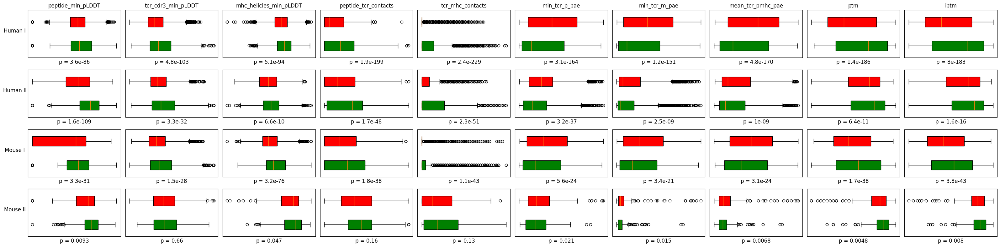

In [61]:
import matplotlib.pyplot as plt
import polars as pl
from scipy.stats import ttest_ind


featnames = [
    "peptide_min_pLDDT",
    "tcr_cdr3_min_pLDDT",
    "mhc_helicies_min_pLDDT",
    "peptide_tcr_contacts",
    "tcr_mhc_contacts",
    "min_tcr_p_pae",
    "min_tcr_m_pae",
    "mean_tcr_pmhc_pae",
    "ptm",
    "iptm",
]

dfs = [
    dat_dict["iedb_human_I"]["df"].to_pandas(),
    pl.concat(
        [dat_dict["iedb_human_II"]["df"], dat_dict["vdjdb_human_II"]["df"]]
    ).to_pandas(),
    pl.concat(
        [dat_dict["iedb_mouse_I"]["df"], dat_dict["vdjdb_mouse_I"]["df"]]
    ).to_pandas(),
    pl.concat(
        [dat_dict["iedb_mouse_II"]["df"], dat_dict["vdjdb_mouse_II"]["df"]]
    ).to_pandas(),
]

fig, axes = plt.subplots(nrows=4, ncols=10, figsize=(32, 8))

for i in range(len(dfs)):
    df = dfs[i]
    row_axes = axes[i]

    for ax, feat in zip(row_axes, featnames):
        noncognate = df.loc[df["cognate"] == False, feat].dropna()
        cognate = df.loc[df["cognate"] == True, feat].dropna()

        t_stat, p_value = ttest_ind(
            noncognate, cognate, equal_var=False, nan_policy="omit"
        )

        bp = ax.boxplot(
            [noncognate, cognate],
            positions=[2, 1],
            vert=False,
            patch_artist=True,
            widths=0.4,
        )

        colors = ["red", "green"]
        for patch, color in zip(bp["boxes"], colors):
            patch.set_facecolor(color)

        for median in bp["medians"]:
            median.set(color="black", linewidth=3)

        ax.set_yticks([])
        ax.set_xticks([])

        ax.set_xlabel(f"p = {p_value:.2g}", size="large")

# label rows and cols
for ax, col in zip(axes[0], featnames):
    ax.set_title(col)

for ax, row in zip(axes[:, 0], ["Human I", "Human II", "Mouse I", "Mouse II"]):
    ax.set_ylabel(row, rotation=0, size="large", labelpad=30)


plt.tight_layout()
plt.show()